# Hamiltonian Neural Networks — Experiments

Recreation and extension of HNN / D-HNN results in Python.  
All model definitions, training loops, and plotting live in `src/dhnn/`; this notebook orchestrates the experiments.

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import os, sys

# Ensure the package is importable even without pip install -e
sys.path.insert(0, os.path.join(os.path.dirname(os.getcwd()), "src"))

from dhnn.models import BaselineNN, HNN, DHNN
from dhnn.integrators import integrate_rk4, integrate_leapfrog, rollout
from dhnn.data import (
    generate_data, generate_data_multi_rho, generate_trajectory, meshgrid,
    spring_ode, pendulum_ode, damped_spring_ode,
    H_spring, H_pendulum,
    sample_spring, sample_pendulum, sample_damped_spring,
)
from dhnn.training import train_model, train_dhnn, loss_baseline, loss_hnn, loss_dhnn
from dhnn.plotting import (
    plot_energy_surfaces, plot_training_curves,
    plot_comparison, plot_vector_field, plot_integrator_comparison,
    thesis_viridial, thesis_viridial_r, C,
)
from dhnn.animation import create_dhnn_animation

# Style
plt.style.use(os.path.join(os.path.dirname(os.getcwd()), "Thesis_style.mplstyle"))

# Reproducibility
torch.manual_seed(42)
np.random.seed(42)

print(f"PyTorch {torch.__version__}  •  device: {'cuda' if torch.cuda.is_available() else 'cpu'}")

PyTorch 2.10.0  •  device: cpu


---
## 1. Hamiltonian Energy Surfaces

Sanity-check: visualise the analytical Hamiltonians for the harmonic oscillator and ideal pendulum.

  → saved /Users/aleksandersekkelsten/D_HNN/figures/hamiltonian_energy_surfaces.pdf


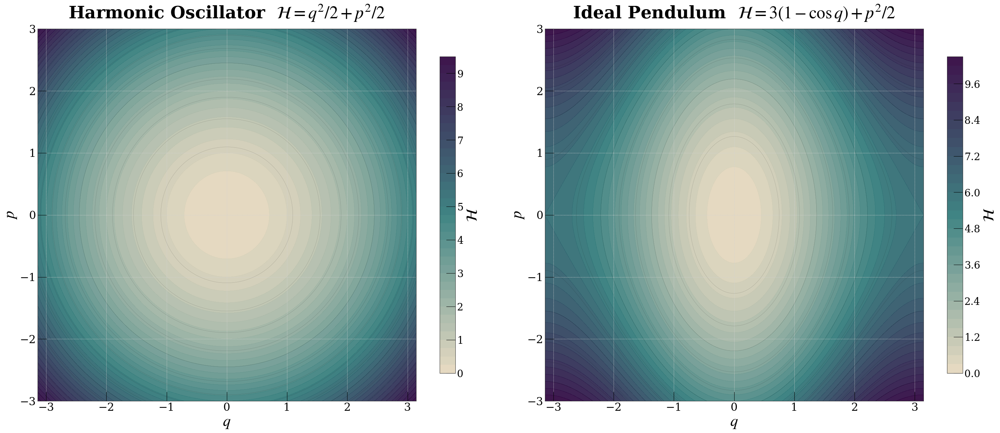

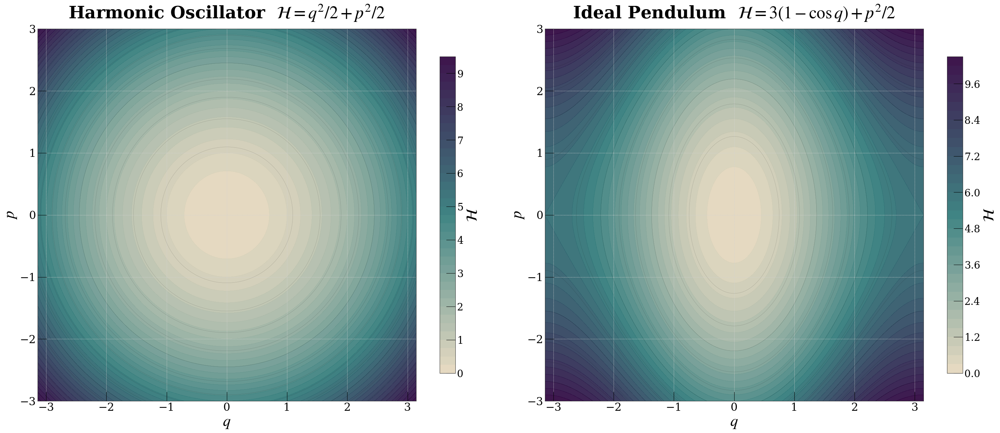

In [2]:
plot_energy_surfaces(
    [H_spring, H_pendulum],
    ["Harmonic Oscillator  $\\mathcal{H}=q^2/2+p^2/2$",
     "Ideal Pendulum  $\\mathcal{H}=3(1-\\cos q)+p^2/2$"],
    save_as="hamiltonian_energy_surfaces.pdf",
)

---
## 2. Symplectic Integrators: RK4 vs Leapfrog

Leapfrog exactly preserves the symplectic structure → bounded energy error over arbitrary horizons.

  → saved /Users/aleksandersekkelsten/D_HNN/figures/integrator_comparison.pdf


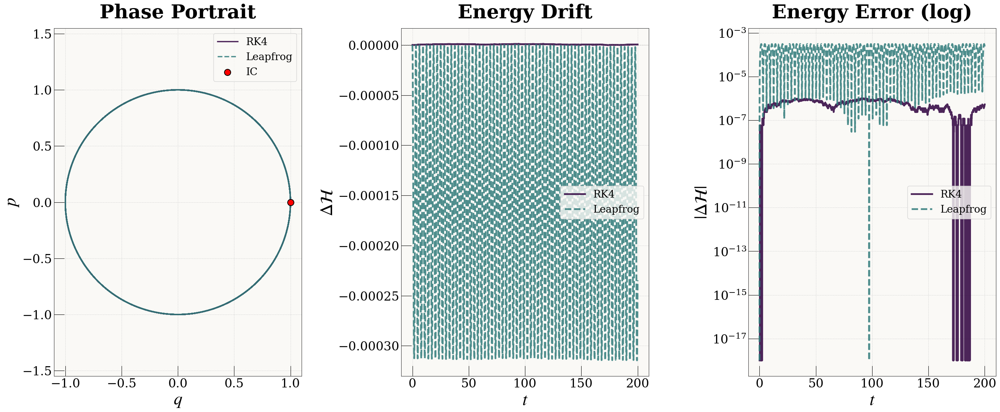

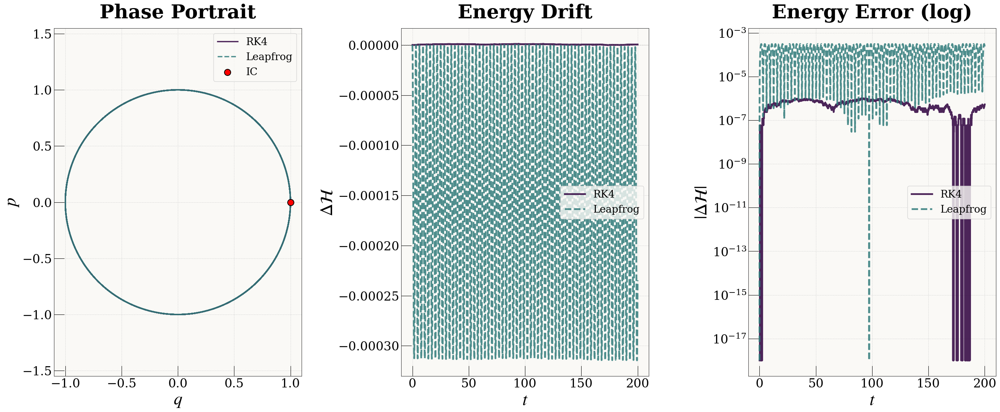

In [3]:
dt, n_steps = 0.05, 4000
t_arr = np.arange(n_steps + 1) * dt

# RK4
spring_f = lambda y: torch.stack([y[1], -y[0]])
rk4_traj = integrate_rk4(spring_f, torch.tensor([1.0, 0.0]), dt, n_steps)
E_rk4 = (0.5 * rk4_traj[:, 0]**2 + 0.5 * rk4_traj[:, 1]**2).detach().numpy()

# Leapfrog
qs_lf, ps_lf = integrate_leapfrog(
    lambda q, p: q, lambda q, p: p,
    torch.tensor(1.0), torch.tensor(0.0), dt, n_steps,
)
E_lf = (0.5 * qs_lf**2 + 0.5 * ps_lf**2).detach().numpy()

plot_integrator_comparison(
    t_arr, E_rk4, E_lf,
    rk4_traj[:, 0].numpy(), rk4_traj[:, 1].numpy(),
    qs_lf.numpy(), ps_lf.numpy(),
    save_as="integrator_comparison.pdf",
)

---
## 3. Data Generation & Visualisation

Generate training and test trajectories for the **harmonic oscillator** and **ideal pendulum**.

In [4]:
N_TRAIN, N_TEST, N_STEPS = 50, 10, 100

# ── Spring ────────────────────────────────────────────────
t_sp, x_tr_sp, y_tr_sp = generate_data(spring_ode, N_TRAIN, N_STEPS, 4*np.pi, sample_spring)
_,    x_te_sp, y_te_sp = generate_data(spring_ode, N_TEST,  N_STEPS, 4*np.pi, sample_spring)

# ── Pendulum ──────────────────────────────────────────────
t_pd, x_tr_pd, y_tr_pd = generate_data(pendulum_ode, N_TRAIN, N_STEPS, 4*np.pi, sample_pendulum)
_,    x_te_pd, y_te_pd = generate_data(pendulum_ode, N_TEST,  N_STEPS, 4*np.pi, sample_pendulum)

print(f"Spring   →  train {x_tr_sp.shape}  test {x_te_sp.shape}")
print(f"Pendulum →  train {x_tr_pd.shape}  test {x_te_pd.shape}")

Spring   →  train (50, 100, 2)  test (10, 100, 2)
Pendulum →  train (50, 100, 2)  test (10, 100, 2)


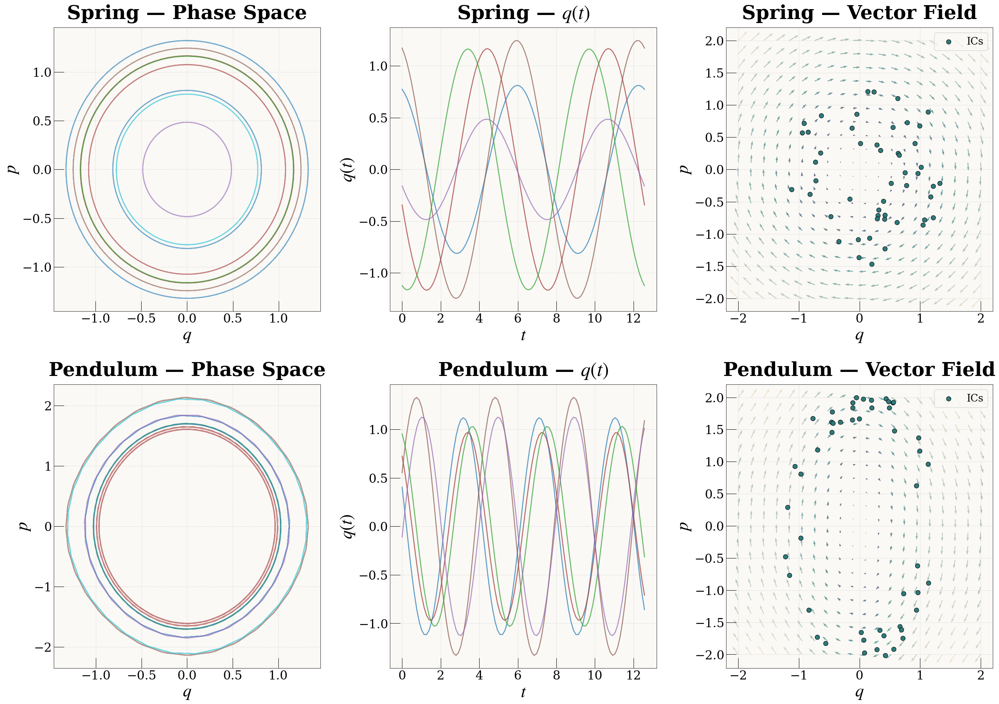

In [5]:
# ── Visualise data ────────────────────────────────────────
Q_g, P_g, coords_g = meshgrid(20)
fig, axes = plt.subplots(2, 3, figsize=(28, 20))

for row, (label, t, x_tr, ode_fn) in enumerate([
    ("Spring",   t_sp, x_tr_sp, spring_ode),
    ("Pendulum", t_pd, x_tr_pd, pendulum_ode),
]):
    # Phase space
    for i in range(min(8, len(x_tr))):
        axes[row, 0].plot(x_tr[i, :, 0], x_tr[i, :, 1], alpha=0.6, lw=2)
    axes[row, 0].set_xlabel("$q$"); axes[row, 0].set_ylabel("$p$")
    axes[row, 0].set_title(f"{label} — Phase Space")

    # Time series
    for i in range(min(5, len(x_tr))):
        axes[row, 1].plot(t, x_tr[i, :, 0], alpha=0.7, lw=2)
    axes[row, 1].set_xlabel("$t$"); axes[row, 1].set_ylabel("$q(t)$")
    axes[row, 1].set_title(f"{label} — $q(t)$")

    # Vector field
    vf = np.array([ode_fn(c) for c in coords_g])
    speed = np.sqrt(vf[:, 0]**2 + vf[:, 1]**2)
    axes[row, 2].quiver(Q_g, P_g, vf[:, 0].reshape(Q_g.shape) * 0.1,
                         vf[:, 1].reshape(Q_g.shape) * 0.1,
                         speed.reshape(Q_g.shape), cmap=thesis_viridial, alpha=0.7)
    axes[row, 2].scatter(x_tr[:, 0, 0], x_tr[:, 0, 1], c=C["dhnn"], zorder=5,
                          s=80, edgecolors="k", linewidths=0.8, label="ICs")
    axes[row, 2].set_xlabel("$q$"); axes[row, 2].set_ylabel("$p$")
    axes[row, 2].set_title(f"{label} — Vector Field"); axes[row, 2].legend(fontsize=20)

fig.tight_layout()
fig.savefig("../figures/data_overview.pdf", bbox_inches="tight", dpi=150)
plt.show()

---
## 4. Train HNN vs Baseline — Harmonic Oscillator

In [ ]:
# ── Train on Spring ───────────────────────────────────────
baseline_sp = BaselineNN(2, 200, 2)
hnn_sp      = HNN(2, 200)

print("── Baseline ──")
tr_b_sp, te_b_sp = train_model(baseline_sp, loss_baseline,
                                x_tr_sp, y_tr_sp, x_te_sp, y_te_sp,
                                epochs=5000, verbose_every=1000)
print("\n── HNN ──")
tr_h_sp, te_h_sp = train_model(hnn_sp, loss_hnn,
                                x_tr_sp, y_tr_sp, x_te_sp, y_te_sp,
                                epochs=5000, verbose_every=1000)

── Baseline ──


Training:   0%|          | 0/5000 [00:00<?, ?it/s]

  Epoch     1 │ Train 0.321039 │ Test 0.294186
  Epoch  1000 │ Train 0.000113 │ Test 0.000118
  Epoch  2000 │ Train 0.000112 │ Test 0.000110


  → saved /Users/aleksandersekkelsten/D_HNN/figures/spring_training_curves.pdf


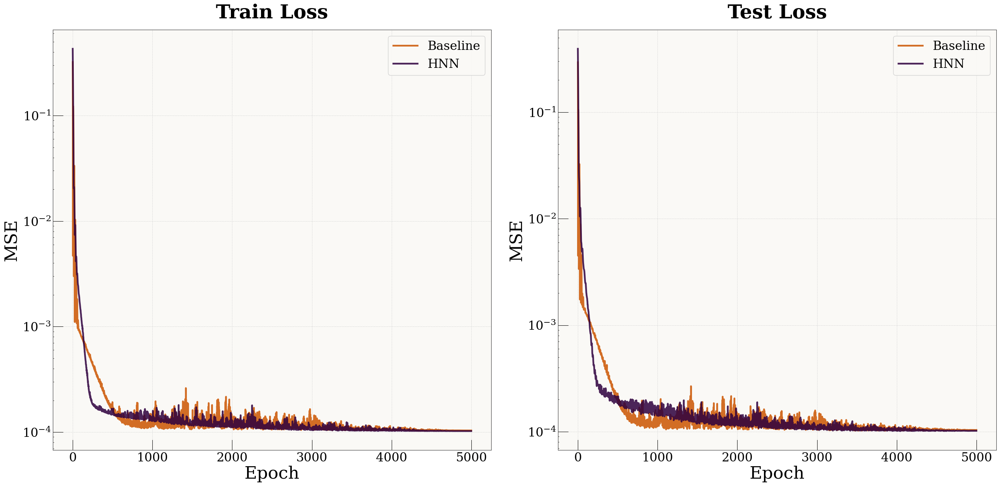

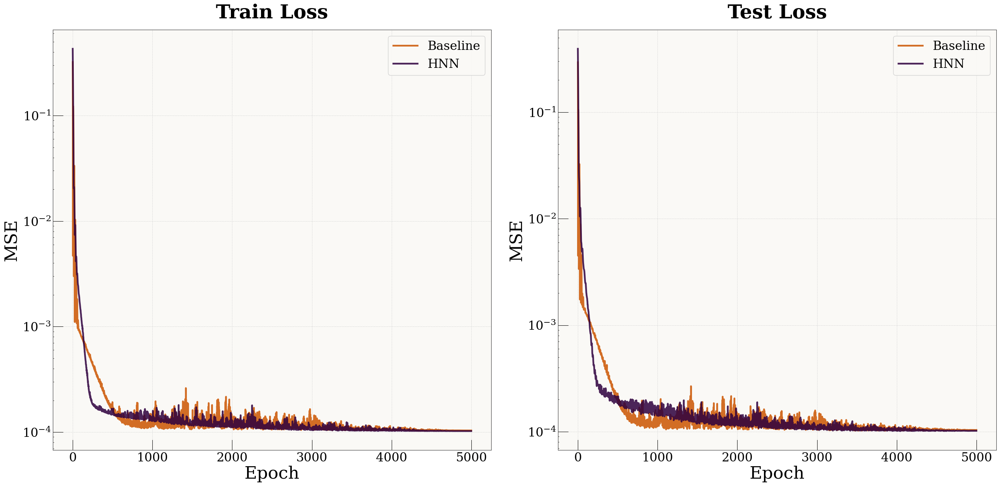

In [7]:
plot_training_curves(
    {"Baseline": (tr_b_sp, te_b_sp), "HNN": (tr_h_sp, te_h_sp)},
    save_as="spring_training_curves.pdf",
)

  → saved /Users/aleksandersekkelsten/D_HNN/figures/spring_comparison.pdf


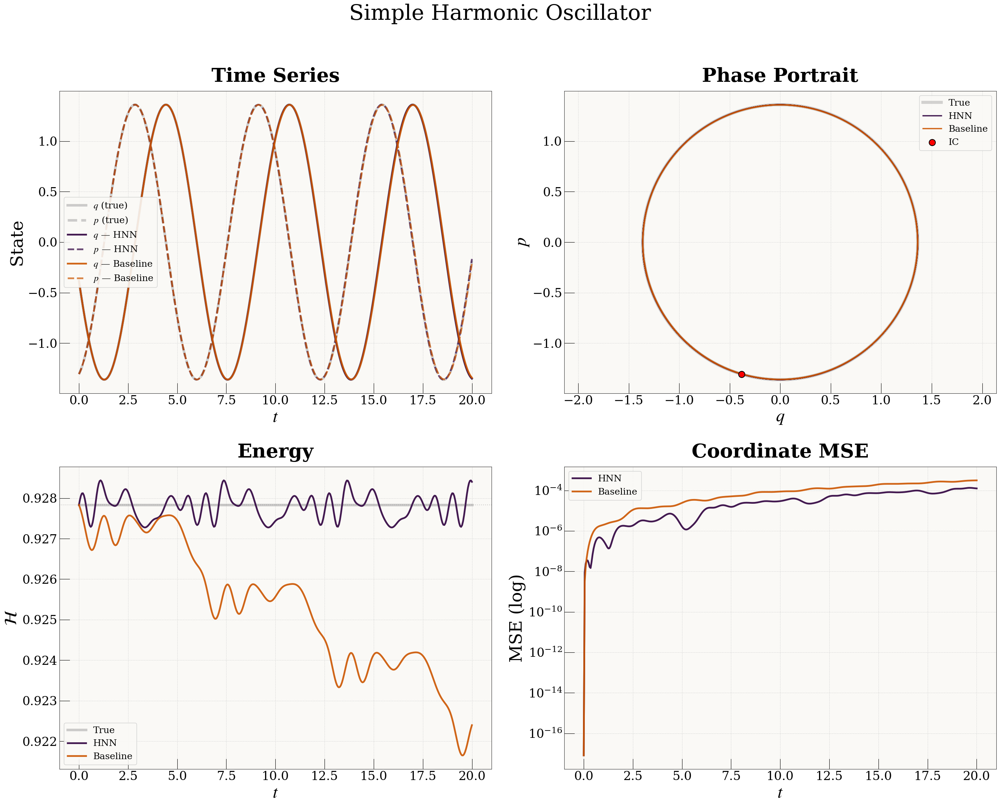

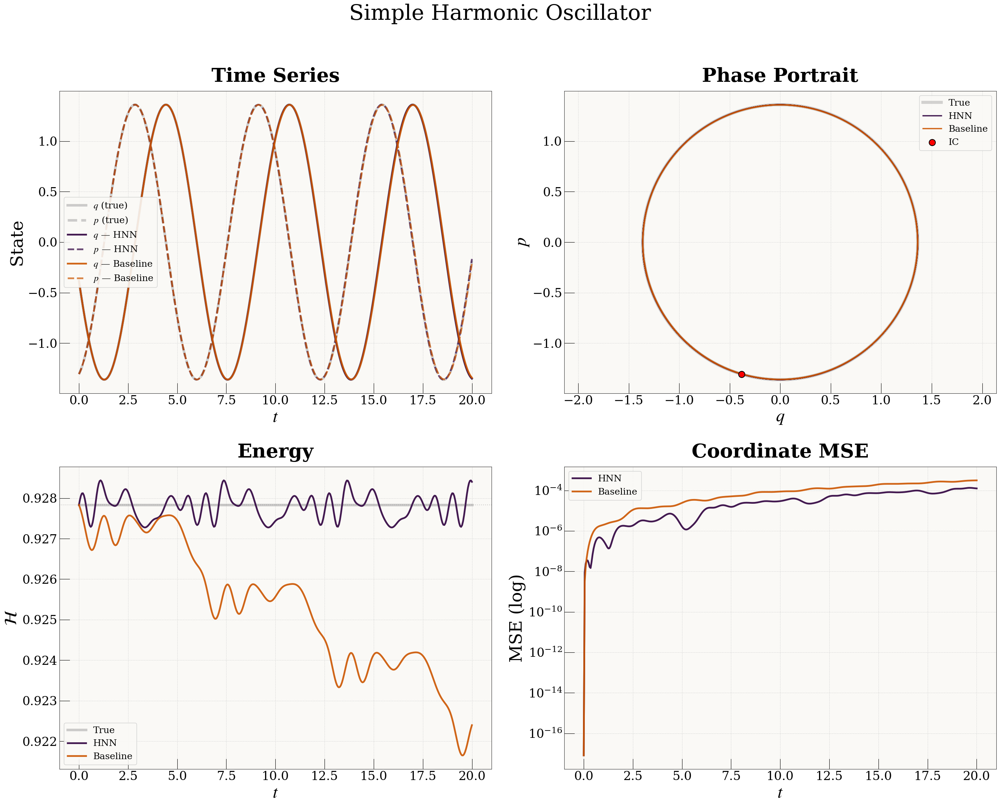

In [8]:
# ── Roll-out and compare ──────────────────────────────────
q0_sp, p0_sp = sample_spring()
y0_sp = np.array([q0_sp, p0_sp])

t_eval_sp, gt_sp = generate_trajectory(spring_ode, y0_sp, 20.0, 400)
dt_sp = t_eval_sp[1] - t_eval_sp[0]

pred_hnn_sp  = rollout(hnn_sp.time_derivative, y0_sp, dt_sp, len(t_eval_sp) - 1)
pred_base_sp = rollout(lambda x: baseline_sp(x), y0_sp, dt_sp, len(t_eval_sp) - 1)

plot_comparison(
    t_eval_sp, gt_sp,
    {"HNN": pred_hnn_sp, "Baseline": pred_base_sp},
    H_func=H_spring,
    system_name="Simple Harmonic Oscillator",
    save_as="spring_comparison.pdf",
)

---
## 5. Train HNN vs Baseline — Ideal Pendulum

In [9]:
# ── Train on Pendulum ─────────────────────────────────────
baseline_pd = BaselineNN(2, 200, 2)
hnn_pd      = HNN(2, 200)

print("── Baseline ──")
tr_b_pd, te_b_pd = train_model(baseline_pd, loss_baseline,
                                x_tr_pd, y_tr_pd, x_te_pd, y_te_pd,
                                epochs=5000, verbose_every=1000)
print("\n── HNN ──")
tr_h_pd, te_h_pd = train_model(hnn_pd, loss_hnn,
                                x_tr_pd, y_tr_pd, x_te_pd, y_te_pd,
                                epochs=5000, verbose_every=1000)

── Baseline ──


Training:   0%|          | 0/5000 [00:00<?, ?it/s]

  Epoch     1 │ Train 2.322767 │ Test 2.225413
  Epoch  1000 │ Train 0.000249 │ Test 0.000212
  Epoch  2000 │ Train 0.000157 │ Test 0.000148
  Epoch  3000 │ Train 0.000137 │ Test 0.000129
  Epoch  4000 │ Train 0.000127 │ Test 0.000123
  Epoch  5000 │ Train 0.000123 │ Test 0.000118

── HNN ──


Training:   0%|          | 0/5000 [00:00<?, ?it/s]

  Epoch     1 │ Train 2.857079 │ Test 2.727008
  Epoch  1000 │ Train 0.000196 │ Test 0.000198
  Epoch  2000 │ Train 0.000130 │ Test 0.000137
  Epoch  3000 │ Train 0.000115 │ Test 0.000118
  Epoch  4000 │ Train 0.000109 │ Test 0.000111
  Epoch  5000 │ Train 0.000107 │ Test 0.000110


  → saved /Users/aleksandersekkelsten/D_HNN/figures/pendulum_training_curves.pdf
  → saved /Users/aleksandersekkelsten/D_HNN/figures/pendulum_comparison.pdf


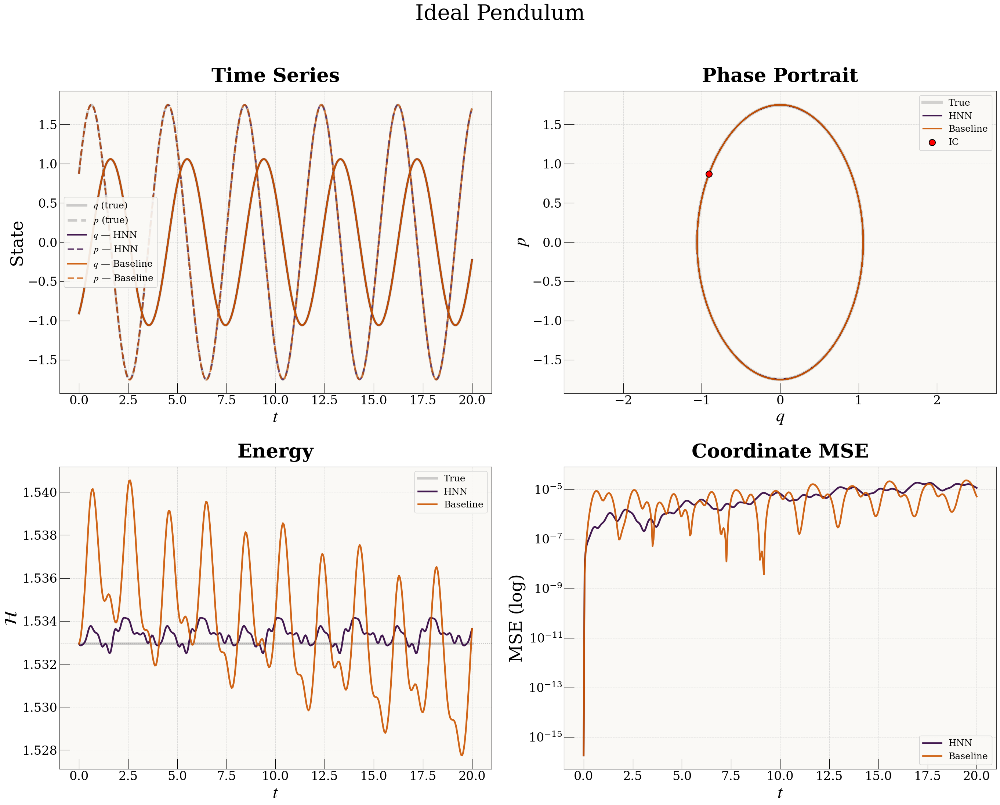

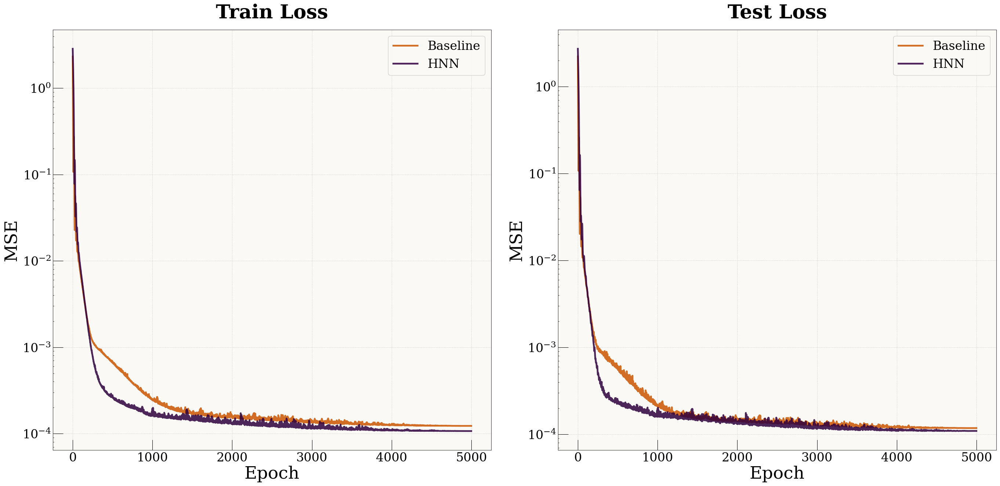

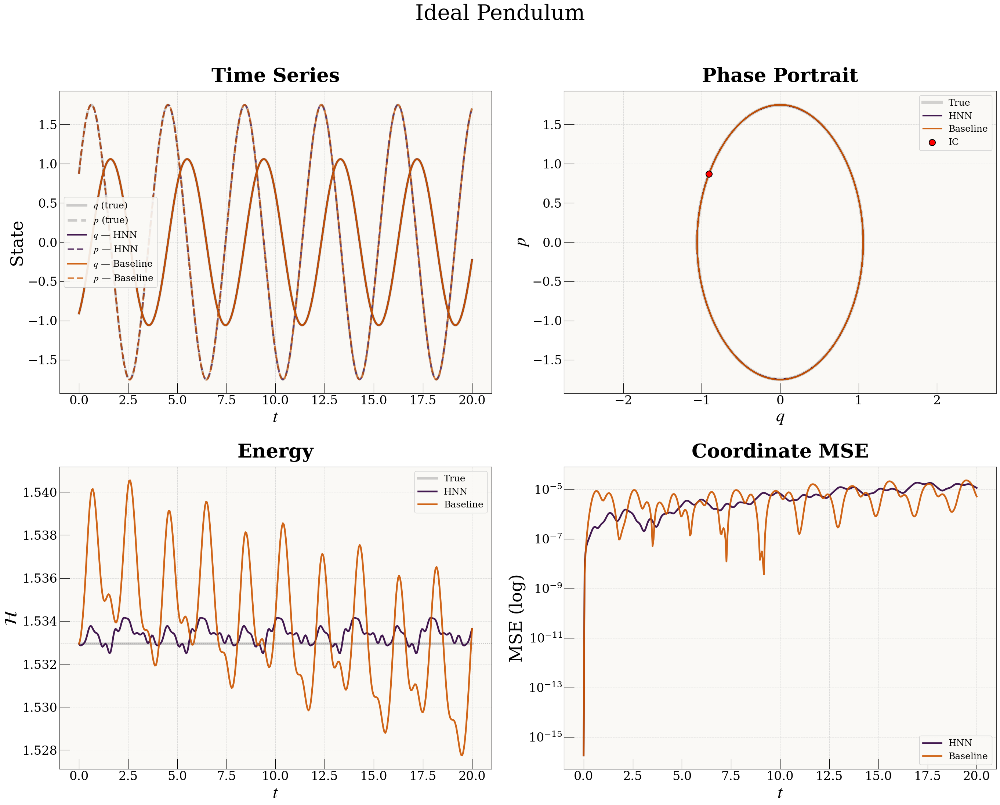

In [10]:
plot_training_curves(
    {"Baseline": (tr_b_pd, te_b_pd), "HNN": (tr_h_pd, te_h_pd)},
    save_as="pendulum_training_curves.pdf",
)

# Roll-out
q0_pd, p0_pd = sample_pendulum()
y0_pd = np.array([q0_pd, p0_pd])

t_eval_pd, gt_pd = generate_trajectory(pendulum_ode, y0_pd, 20.0, 400)
dt_pd = t_eval_pd[1] - t_eval_pd[0]

pred_hnn_pd  = rollout(hnn_pd.time_derivative, y0_pd, dt_pd, len(t_eval_pd) - 1)
pred_base_pd = rollout(lambda x: baseline_pd(x), y0_pd, dt_pd, len(t_eval_pd) - 1)

plot_comparison(
    t_eval_pd, gt_pd,
    {"HNN": pred_hnn_pd, "Baseline": pred_base_pd},
    H_func=H_pendulum,
    system_name="Ideal Pendulum",
    save_as="pendulum_comparison.pdf",
)

---
## 6. Dissipative HNN — Damped Harmonic Oscillator (Multi-$\rho$)

The D-HNN decomposes the vector field into a conservative (Hamiltonian) and a dissipative (gradient) component. We train on **multiple damping coefficients** $\rho \in \{0.1, 0.3, 0.5, 0.8, 1.2, 2.0\}$ simultaneously so the model learns $\rho$ as a continuous parameter.

In [ ]:
# ── Generate multi-ρ damped spring data ───────────────────
TRAIN_RHOS = [0.1, 0.3, 0.5, 0.8, 1.2, 2.0]

def damped_spring_factory(rho):
    """Return an ODE function for damped spring at a specific ρ."""
    return lambda y: damped_spring_ode(y, rho=rho)

t_ds, x_tr_ds, y_tr_ds, rho_tr_ds = generate_data_multi_rho(
    damped_spring_factory,
    n_sims_per_rho=10, n_steps=N_STEPS, t_end=4*np.pi,
    sampler=sample_damped_spring, rho_values=TRAIN_RHOS,
)
_, x_te_ds, y_te_ds, rho_te_ds = generate_data_multi_rho(
    damped_spring_factory,
    n_sims_per_rho=3, n_steps=N_STEPS, t_end=4*np.pi,
    sampler=sample_damped_spring, rho_values=TRAIN_RHOS,
)

print(f"Train: {x_tr_ds.shape}  ρ ∈ {sorted(set(rho_tr_ds))}")
print(f"Test:  {x_te_ds.shape}  ρ ∈ {sorted(set(rho_te_ds))}")

# Vector field comparison: conservative vs damped
fig, axes = plt.subplots(1, 3, figsize=(28, 12))
vf_cons = np.array([spring_ode(c) for c in coords_g])
vf_damp = np.array([damped_spring_ode(c) for c in coords_g])
vf_diff = vf_damp - vf_cons

for ax, vf, title in zip(axes,
    [vf_cons, vf_damp, vf_diff],
    ["Conservative ($\\rho=0$)", "Damped ($\\rho=0.5$)", "Dissipative component"]):
    speed = np.sqrt(vf[:, 0]**2 + vf[:, 1]**2)
    ax.quiver(Q_g, P_g, vf[:, 0].reshape(Q_g.shape)*0.1,
              vf[:, 1].reshape(Q_g.shape)*0.1,
              speed.reshape(Q_g.shape), cmap=thesis_viridial, alpha=0.8)
    ax.set_xlabel("$q$"); ax.set_ylabel("$p$"); ax.set_title(title)

fig.tight_layout()
fig.savefig("../figures/damped_spring_fields.pdf", bbox_inches="tight", dpi=150)
plt.show()

In [ ]:
# ── Train HNN + D-HNN on damped spring (no baseline) ──────
hnn_ds  = HNN(2, 256)
dhnn_ds = DHNN(2, 256)

print("── HNN (ignores damping) ──")
tr_h_ds, te_h_ds = train_model(hnn_ds, loss_hnn,
                                x_tr_ds, y_tr_ds, x_te_ds, y_te_ds,
                                epochs=5000, verbose_every=1000)

print("\n── D-HNN (multi-ρ) ──")
tr_d_ds, te_d_ds = train_dhnn(dhnn_ds,
                               x_tr_ds, y_tr_ds, x_te_ds, y_te_ds,
                               epochs=5000,
                               rho_train=rho_tr_ds, rho_test=rho_te_ds,
                               verbose_every=1000)

In [ ]:
plot_training_curves(
    {"HNN": (tr_h_ds, te_h_ds), "D-HNN": (tr_d_ds, te_d_ds)},
    save_as="damped_spring_training_curves.pdf",
)

# ── Roll-out comparison (ρ = 0.5) ────────────────────────
q0_ds, p0_ds = sample_damped_spring()
y0_ds = np.array([q0_ds, p0_ds])

t_eval_ds, gt_ds = generate_trajectory(damped_spring_ode, y0_ds, 15.0, 300)
dt_ds = t_eval_ds[1] - t_eval_ds[0]

pred_hnn_ds  = rollout(hnn_ds.time_derivative, y0_ds, dt_ds, len(t_eval_ds) - 1)
pred_dhnn_ds = rollout(lambda x: dhnn_ds.time_derivative(x, rho=0.5), y0_ds, dt_ds, len(t_eval_ds) - 1)

# ── Phase-space comparison ───────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(28, 14))

ax = axes[0]
ax.plot(gt_ds[:, 0], gt_ds[:, 1], color=C["gt"], lw=5, alpha=0.35, label="Ground truth")
ax.plot(pred_hnn_ds[:, 0], pred_hnn_ds[:, 1], color=C["hnn"], lw=2.5, label="HNN")
ax.plot(pred_dhnn_ds[:, 0], pred_dhnn_ds[:, 1], color=C["dhnn"], lw=2.5, label="D-HNN")
ax.scatter([y0_ds[0]], [y0_ds[1]], c="red", s=150, zorder=5,
           edgecolors="k", linewidths=1.5, label="IC")
ax.quiver(Q_g, P_g, vf_damp[:, 0].reshape(Q_g.shape)*0.08,
          vf_damp[:, 1].reshape(Q_g.shape)*0.08, color="grey", alpha=0.15)
ax.set_xlabel("$q$"); ax.set_ylabel("$p$")
ax.set_title("Damped Spring — Phase Portrait ($\\rho=0.5$)"); ax.legend(fontsize=20)

# MSE over time
ax = axes[1]
for lbl, pred, c in [
    ("HNN", pred_hnn_ds, C["hnn"]),
    ("D-HNN", pred_dhnn_ds, C["dhnn"]),
]:
    L = min(len(pred), len(gt_ds))
    mse = np.mean((pred[:L] - gt_ds[:L])**2, axis=1)
    ax.semilogy(t_eval_ds[:L], mse + 1e-18, label=lbl, alpha=0.85, color=c)
ax.set_xlabel("$t$"); ax.set_ylabel("MSE (log)")
ax.set_title("Coordinate MSE"); ax.legend(fontsize=20)

fig.tight_layout()
fig.savefig("../figures/damped_spring_comparison.pdf", bbox_inches="tight", dpi=150)
plt.show()

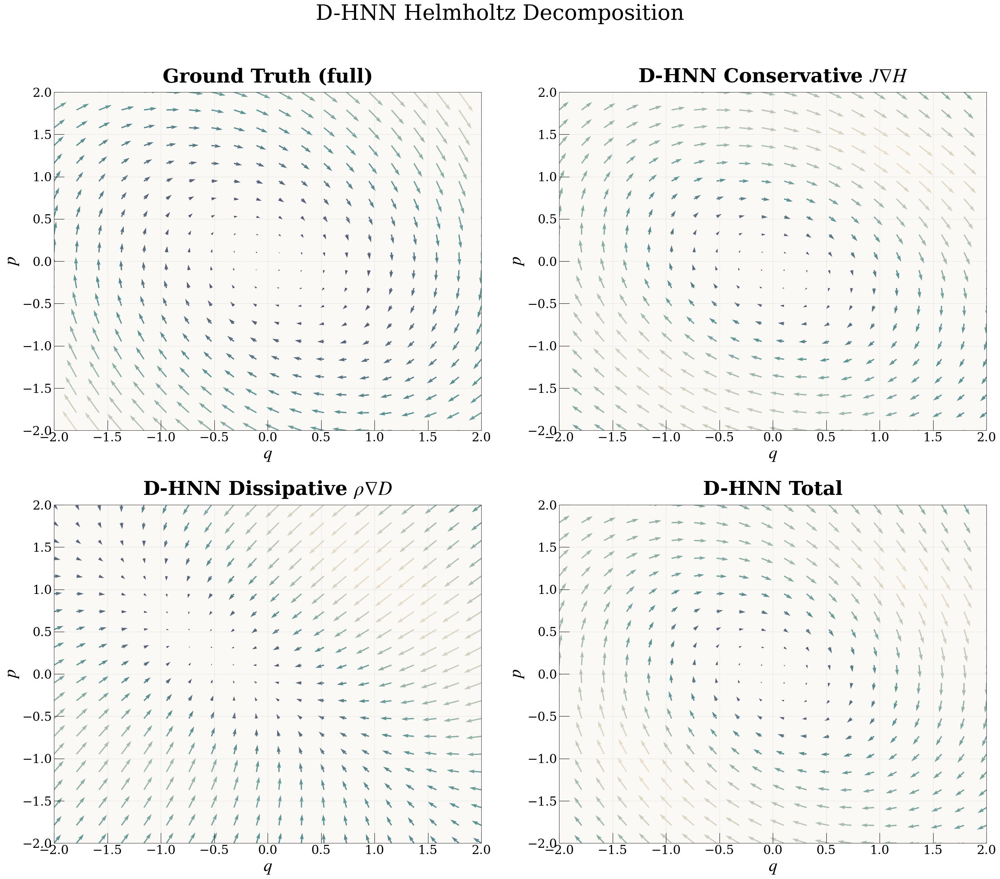

In [14]:
# ── Learned vector-field decomposition ────────────────────
# Compare what the D-HNN learned for the conservative and dissipative parts
fig, axes = plt.subplots(2, 2, figsize=(28, 24))
titles = ["Ground Truth (full)", "D-HNN Conservative $J\\nabla H$",
          "D-HNN Dissipative $\\rho\\nabla D$", "D-HNN Total"]

coords_t = torch.tensor(coords_g, dtype=torch.float32)
dhnn_ds.eval()
vf_dhnn_cons = dhnn_ds.conservative_part(coords_t).detach().numpy()
vf_dhnn_diss = dhnn_ds.dissipative_part(coords_t, rho=0.5).detach().numpy()
vf_dhnn_full = vf_dhnn_cons + vf_dhnn_diss
dhnn_ds.train()

fields = [vf_damp, vf_dhnn_cons, vf_dhnn_diss, vf_dhnn_full]
for ax, vf, title in zip(axes.flat, fields, titles):
    speed = np.sqrt(vf[:, 0]**2 + vf[:, 1]**2)
    ax.quiver(Q_g, P_g, vf[:, 0].reshape(Q_g.shape)*0.1,
              vf[:, 1].reshape(Q_g.shape)*0.1,
              speed.reshape(Q_g.shape), cmap=thesis_viridial, alpha=0.8)
    ax.set_xlabel("$q$"); ax.set_ylabel("$p$"); ax.set_title(title)
    ax.set_xlim(-2, 2); ax.set_ylim(-2, 2)

fig.suptitle("D-HNN Helmholtz Decomposition", fontsize=42, y=1.01)
fig.tight_layout()
fig.savefig("../figures/dhnn_decomposition.pdf", bbox_inches="tight", dpi=150)
plt.show()

---
## 7. Long-Horizon Stability — Phase Portraits (100+ periods)

The key selling point of HNNs: orbits stay closed (or nearly so) over *very* long rollouts, while the baseline spirals.

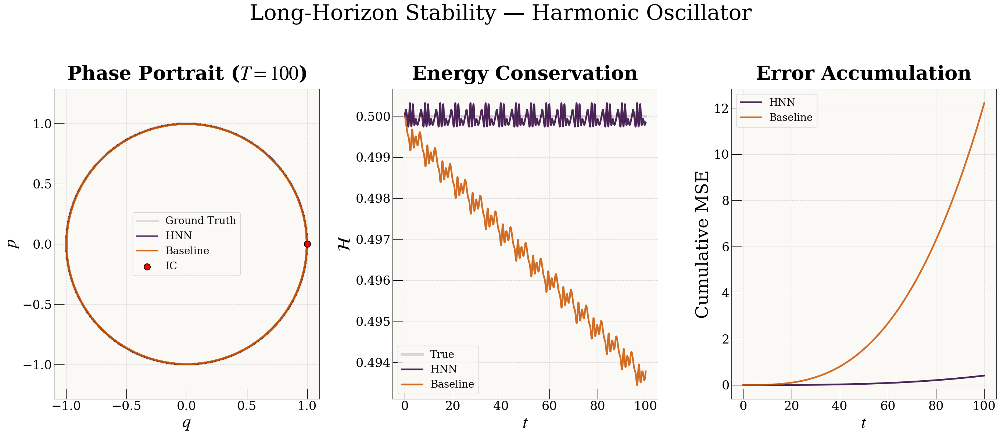

In [15]:
# ── Long-horizon rollout for spring ──────────────────────
T_LONG = 100.0  # ~16 periods
N_LONG = 2000
y0_long = np.array([1.0, 0.0])

t_long, gt_long = generate_trajectory(spring_ode, y0_long, T_LONG, N_LONG)
dt_long = t_long[1] - t_long[0]
pred_hnn_long  = rollout(hnn_sp.time_derivative, y0_long, dt_long, N_LONG - 1)
pred_base_long = rollout(lambda x: baseline_sp(x), y0_long, dt_long, N_LONG - 1)

fig, axes = plt.subplots(1, 3, figsize=(28, 12))

# Phase portrait
for lbl, traj, c, a, lw in [
    ("Ground Truth", gt_long, C["gt"], 0.25, 5),
    ("HNN", pred_hnn_long, C["hnn"], 0.85, 2.5),
    ("Baseline", pred_base_long, C["baseline"], 0.85, 2.5),
]:
    axes[0].plot(traj[:, 0], traj[:, 1], color=c, alpha=a, lw=lw, label=lbl)
axes[0].scatter([1.0], [0.0], c="red", s=150, zorder=10, edgecolors="k", linewidths=1.5, label="IC")
axes[0].set_xlabel("$q$"); axes[0].set_ylabel("$p$")
axes[0].set_title("Phase Portrait ($T=100$)"); axes[0].legend(fontsize=20)
axes[0].set_aspect("equal", adjustable="datalim")

# Energy over time
E_gt   = H_spring(gt_long[:, 0],        gt_long[:, 1])
E_hnn  = H_spring(pred_hnn_long[:, 0],  pred_hnn_long[:, 1])
E_base = H_spring(pred_base_long[:, 0], pred_base_long[:, 1])

axes[1].plot(t_long, E_gt, color=C["gt"], alpha=0.3, lw=5, label="True")
axes[1].plot(t_long[:len(E_hnn)],  E_hnn,  color=C["hnn"], label="HNN", alpha=0.85)
axes[1].plot(t_long[:len(E_base)], E_base, color=C["baseline"], label="Baseline", alpha=0.85)
axes[1].axhline(E_gt[0], ls=":", color="grey", alpha=0.4, lw=1.5)
axes[1].set_xlabel("$t$"); axes[1].set_ylabel("$\\mathcal{H}$")
axes[1].set_title("Energy Conservation"); axes[1].legend(fontsize=20)

# Cumulative MSE
for lbl, pred, c in [("HNN", pred_hnn_long, C["hnn"]), ("Baseline", pred_base_long, C["baseline"])]:
    L = min(len(pred), len(gt_long))
    mse = np.cumsum(np.mean((pred[:L] - gt_long[:L])**2, axis=1))
    axes[2].plot(t_long[:L], mse, label=lbl, alpha=0.85, color=c)
axes[2].set_xlabel("$t$"); axes[2].set_ylabel("Cumulative MSE")
axes[2].set_title("Error Accumulation"); axes[2].legend(fontsize=20)

fig.suptitle("Long-Horizon Stability — Harmonic Oscillator", fontsize=42, y=1.01)
fig.tight_layout()
fig.savefig("../figures/long_horizon_spring.pdf", bbox_inches="tight", dpi=150)
plt.show()

---
## 8. Varying Damping $\rho$ — D-HNN Generalisation

The D-HNN is trained on multiple damping coefficients $\rho \in \{0.1, 0.3, 0.5, 0.8, 1.2, 2.0\}$ simultaneously, learning a single shared Hamiltonian $H$ and dissipation potential $D$ that generalise across the full range. Here we test at both **seen** and **unseen** $\rho$ values.

In [ ]:
# ── Vary ρ at test time ───────────────────────────────────
# Mix of SEEN (trained on) and UNSEEN damping coefficients
rho_vals = np.array([0.0, 0.1, 0.5, 1.2, 2.5, 4.0])
n_steps_rho = 300
t_end_rho = 15.0

fig, axes = plt.subplots(2, 3, figsize=(28, 20))

# Use the same IC for all panels for a fair comparison
q0_rho, p0_rho = 1.0, 0.5
y0_rho = np.array([q0_rho, p0_rho])

for i, rho in enumerate(rho_vals):
    ax = axes[i // 3, i % 3]

    ode_rho = lambda y, _rho=rho: np.array([y[1], -y[0] - _rho * y[1]])
    t_r, gt_r = generate_trajectory(ode_rho, y0_rho, t_end_rho, n_steps_rho)
    dt_r = t_r[1] - t_r[0]

    pred_dhnn_r = rollout(
        lambda x, _rho=rho: dhnn_ds.time_derivative(x, rho=_rho),
        y0_rho, dt_r, n_steps_rho - 1,
    )

    seen = rho in TRAIN_RHOS
    lbl_suffix = " (seen)" if seen else " (unseen)"

    ax.plot(gt_r[:, 0], gt_r[:, 1], color=C["gt"], alpha=0.35, lw=4, label="True")
    ax.plot(pred_dhnn_r[:, 0], pred_dhnn_r[:, 1], color=C["dhnn"], lw=2.5, label="D-HNN")
    ax.scatter([y0_rho[0]], [y0_rho[1]], c="red", s=120, zorder=5,
               edgecolors="k", linewidths=1.5)
    ax.set_title(f"$\\rho = {rho:.1f}${lbl_suffix}")
    ax.set_xlabel("$q$"); ax.set_ylabel("$p$"); ax.legend(fontsize=18)

fig.suptitle("D-HNN Generalisation Across Damping Coefficients", fontsize=42, y=1.01)
fig.tight_layout()
fig.savefig("../figures/dhnn_rho_sweep.pdf", bbox_inches="tight", dpi=150)
plt.show()

---
## 9. D-HNN Animated Trajectory Comparison

Animated MP4 showing D-HNN vs ground truth paths drawn simultaneously for varying damping strengths.

In [ ]:
# ── Animate D-HNN vs GT for varying ρ ─────────────────────
style_path = os.path.join(os.path.dirname(os.getcwd()), "Thesis_style.mplstyle")

anim_path = create_dhnn_animation(
    dhnn_ds,
    sampler=sample_damped_spring,
    rho_values=[0.0, 0.25, 0.5, 1.0, 2.0, 4.0],
    t_end=15.0,
    n_steps=300,
    fps=30,
    save_as="dhnn_animation.mp4",
    style_path=style_path,
    fixed_y0=np.array([1.0, 0.5]),
    quiver_n=18,
    quiver_lim=2.0,
)
print(f"Animation saved to: {anim_path}")

---
---
# Future Directions

Below are three research directions ranked by **novelty × real-world impact**, each building directly on the HNN / D-HNN foundation you've already established.

---

## Direction 1 — Quantum-Inspired Latent HNN Autoencoder

**Idea:** When the canonical coordinates $(q, p)$ are *not* directly observed (e.g. you only have pixel video of a pendulum, or raw sensor data from an industrial process), you need an encoder to discover them. Attach a D-HNN in the latent space of an autoencoder, and add a *quantum-inspired embedding layer* — parameterised unitary rotations acting on the latent vector (classically simulated) that mimic variational quantum circuit structure. The unitaries introduce smooth, highly-expressive non-linearities that naturally preserve vector norms (analogous to energy conservation).

**Architecture:**
```
Raw observation x  →  Encoder  →  Quantum Embedding (parameterised unitaries)
                                       ↓
                                  Latent (q, p)
                                       ↓
                                  D-HNN dynamics
                                       ↓
                                  Decoder  →  Predicted next frame x̂
```

**Why it's genuinely useful:**
- **Molecular dynamics from point clouds** — you observe atom positions, but the Hamiltonian lives in generalised coordinates you don't know a priori.
- **Industrial process control** — sensor streams from a chemical reactor or turbine are high-dimensional; the underlying physics is low-dimensional and energy-governed.
- **Video prediction with physics priors** — learning to predict video while *guaranteeing* no unphysical energy blowup.

---

## Direction 2 — Hamiltonian Graph Neural Networks for N-Body & Molecular Systems

**Idea:** For multi-body systems (molecular dynamics, particle physics, celestial mechanics), represent each body as a *node* with state $(q_i, p_i)$, and interactions as *edges*. The total Hamiltonian is:

$$\mathcal{H} = \sum_i T_i(p_i) + \sum_{(i,j) \in \mathcal{E}} V_{ij}(q_i, q_j)$$

Use a GNN with message-passing to learn $V_{ij}$ on edges and extract forces via autograd. This is a natural way to scale HNNs to systems with *variable numbers of particles* and *interaction topologies*.

**Why it's genuinely useful:**
- **Drug discovery** — learning force fields for protein–ligand binding that conserve energy by construction. Current ML force fields (SchNet, DimeNet) do *not* guarantee Hamiltonian structure.
- **Coarse-grained molecular dynamics** — reduce an all-atom simulation to a bead model where the CG potential is a learned Hamiltonian GNN, giving stable long-time dynamics.
- **Orbital mechanics / space debris tracking** — N-body gravitational systems with varying numbers of objects and close encounters.

**Key advantage over vanilla GNNs:** energy conservation is *hard-wired*, so you get stable long-horizon rollouts for free.

---

## Direction 3 — Port-Hamiltonian Networks for Controlled Dissipative Real-World Systems

**Idea:** The most general physics-informed structure for *open* systems (systems with external inputs and dissipation) is the **port-Hamiltonian** form:

$$\dot{z} = \underbrace{(J - R)}_{\text{structure}} \nabla \mathcal{H}(z) + \underbrace{B \, u}_{\text{control input}}$$

where $J$ is skew-symmetric (conservative coupling), $R \succeq 0$ is symmetric (dissipation), and $B \cdot u$ is the external input. Learn $J, R, \mathcal{H}$ and $B$ as neural networks, and you get a model that:
- Automatically satisfies the **dissipation inequality** (2nd law of thermodynamics)
- Naturally integrates with **control design** (you can do Lyapunov-based control directly on the learned model)
- Handles **multi-physics** systems (electrical + mechanical + thermal coupling)

**Why it's genuinely useful:**
- **Robotics** — learn a robot arm's dynamics from data, then do model-predictive control with guaranteed stability.
- **Building energy systems / HVAC** — model heating/cooling dynamics as port-Hamiltonian, optimise energy usage with physics-guaranteed stability.
- **Power grid modelling** — generators, loads, and transmission lines are naturally port-Hamiltonian; learning unknown components while keeping the structure enables safe grid operation.
- **Battery modelling** — electrochemical dynamics with thermal coupling; the port-Hamiltonian form guarantees the learned model won't predict unphysical energy generation.

---

### Recommended Priority

| Direction | Novelty | Impact | Implementation Effort | Recommended Order |
|-----------|---------|--------|----------------------|-------------------|
| Port-Hamiltonian Networks | ★★★★ | ★★★★★ | Medium | **1st** — most mature theory, clearest real-world value |
| Hamiltonian GNN | ★★★★ | ★★★★★ | Medium-High | **2nd** — natural scaling story, molecular dynamics is hot |
| Quantum Latent HNN | ★★★★★ | ★★★ | High | **3rd** — most novel/risky, great thesis differentiator |

All three share the same D-HNN core you already have — the extensions are modular.